In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
sys.path.append('../hovernet')
sys.path.append('../hedest')

import json
import os
import pickle
import torch
import scanpy as sc
import pandas as pd

PATH = '/home/luca/Documents/data/'

# Load data

In [2]:
#load adata
adata_name = 'Visium_FFPE_Human_Breast_Cancer'
data_path = os.path.join(PATH, adata_name)
path_ST_adata = os.path.join(data_path, "ST")
adata = sc.read_visium(path_ST_adata)

#load segmentation
json_path = os.path.join(data_path, "seg_json/pannuke_fast_mask_lvl3.json")
with open(json_path) as json_file:
    hovernet_dict = json.load(json_file)

#load spot proportions
spot_prop_df = pd.read_csv(os.path.join(data_path, f'props/DestVI_4000_hvg_squash_06_02_Visium_FFPE_Human_Breast_Cancer_prop.csv'), index_col=0)
spot_prop_df.index = spot_prop_df.index.astype(str)
ct_list = spot_prop_df.columns.tolist()

/home/luca/anaconda3/envs/plugin-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/luca/anaconda3/envs/plugin-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [3]:
#load images
image_path = os.path.join(data_path, "pyr_tif/Visium_FFPE_Human_Breast_Cancer_image.tif")
image_dict = torch.load(os.path.join(data_path, "image_dict_64.pt"))

In [4]:
#load model infos
model_dir = '../models/Breast_cancer_FFPE/DestVI_4000_hvg_squash_06_02/model_quick_alpha_0.0_lr_0.0003_divergence_l2_beta_0.0_seed_42/'

with open(os.path.join(model_dir, 'info.pickle'), 'rb') as f:
    model_info = pickle.load(f)

In [5]:
from hedest.analysis.pred_analyzer import PredAnalyzer

analyzer = PredAnalyzer(model_info=model_info)

Loading predicted labels...
Use `add_attributes(seg_dict=your_seg_dict)` to add one.


In [6]:
analyzer.add_attributes(image_dict=image_dict,
                        adata=adata,
                        adata_name=adata_name,
                        image_path=image_path,
                        seg_dict=hovernet_dict)

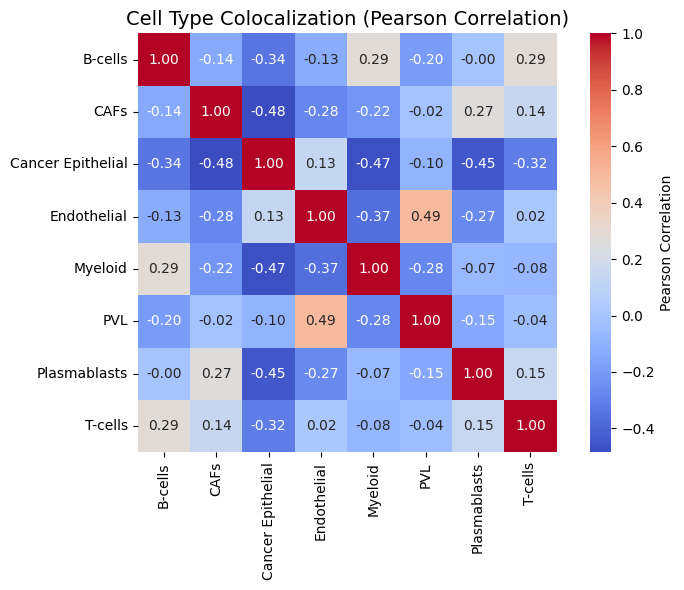

In [7]:
analyzer.plot_colocalization_matrix()

In [8]:
from hedest.analysis.postseg import StdVisualizer

color_dict = {
    '0': ['B-cells', [139, 69, 19, 255]],
    '1': ['CAFs', [255, 140, 0, 255]],
    '2': ['Cancer Epithelial', [31, 119, 180, 255]],
    '3': ['Endothelial', [230, 90, 60, 255]],
    '4': ['Myeloid', [0, 170, 140, 255]],
    '5': ['PVL', [255, 220, 100, 255]],
    '6': ['Plasmablasts', [128, 0, 128, 255]],
    '7': ['T-cells', [0, 150, 0, 255]]
}

analyzer.color_dict = color_dict
plotter = StdVisualizer(image_path, 
                        adata, 
                        adata_name, 
                        seg_dict=analyzer.seg_dict_w_class,
                        color_dict=color_dict)

Visium data found.


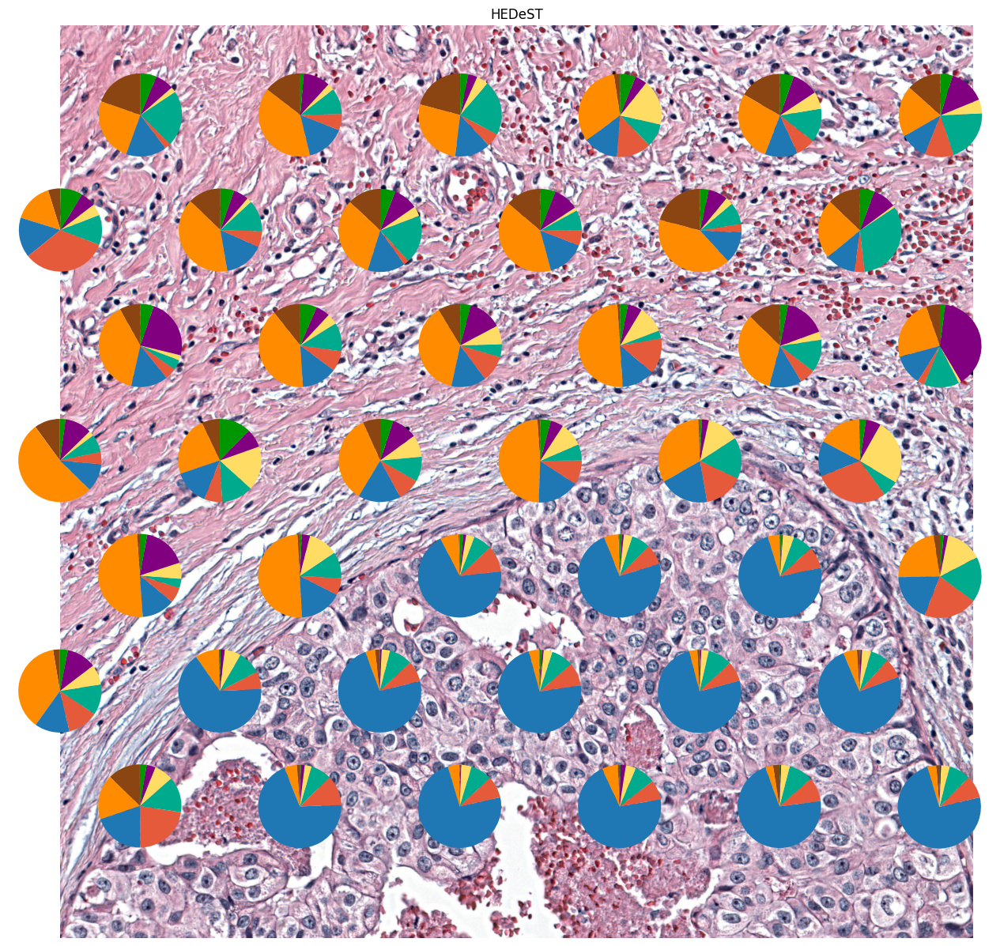

In [47]:
window = ((11500, 9500), (2000, 2000))
plotter.plot_slide(window, title="HEDeST", spot_prop_df=spot_prop_df, show_visium=True)

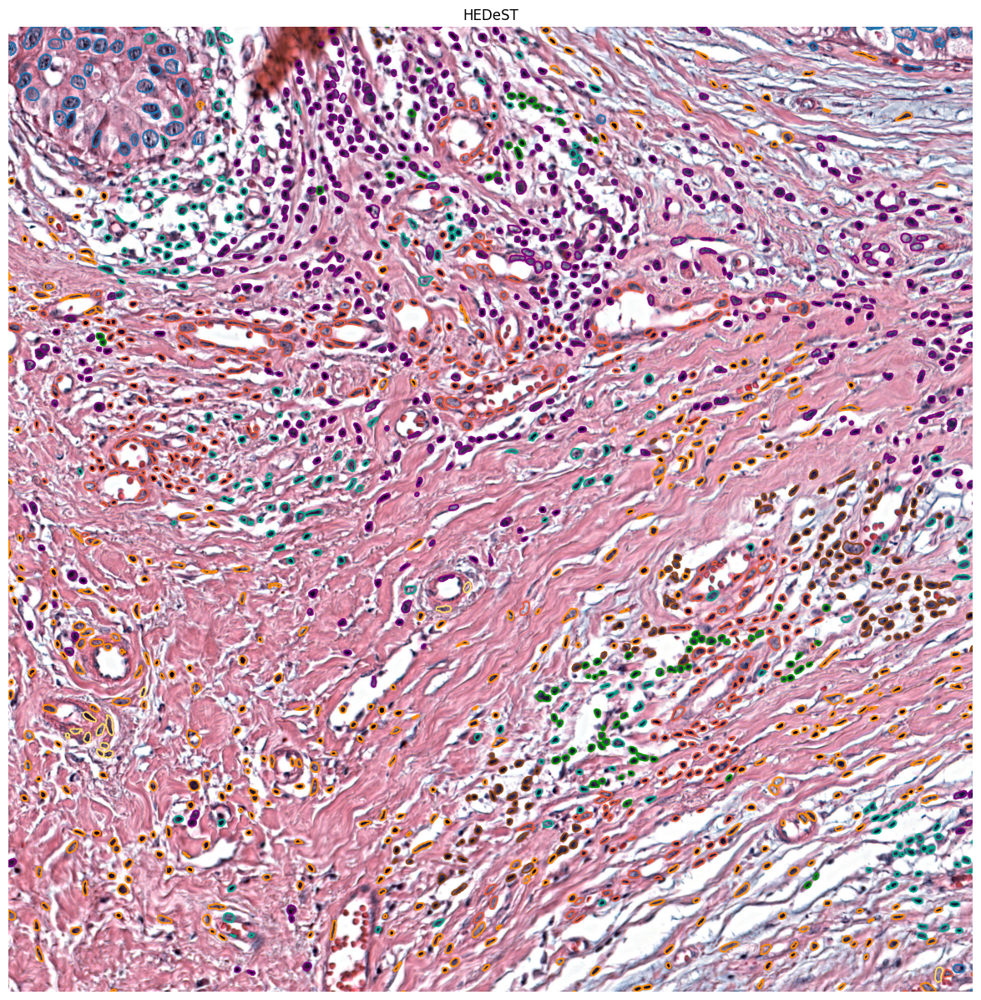

In [190]:
window = ((8500, 9500), (2000, 2000))
plotter.plot_seg(window, title="HEDeST", show_visium=False)

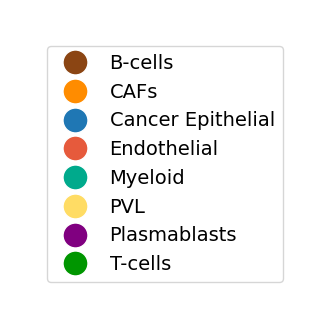

In [252]:
from hedest.analysis.plots import plot_legend

plot_legend(color_dict)

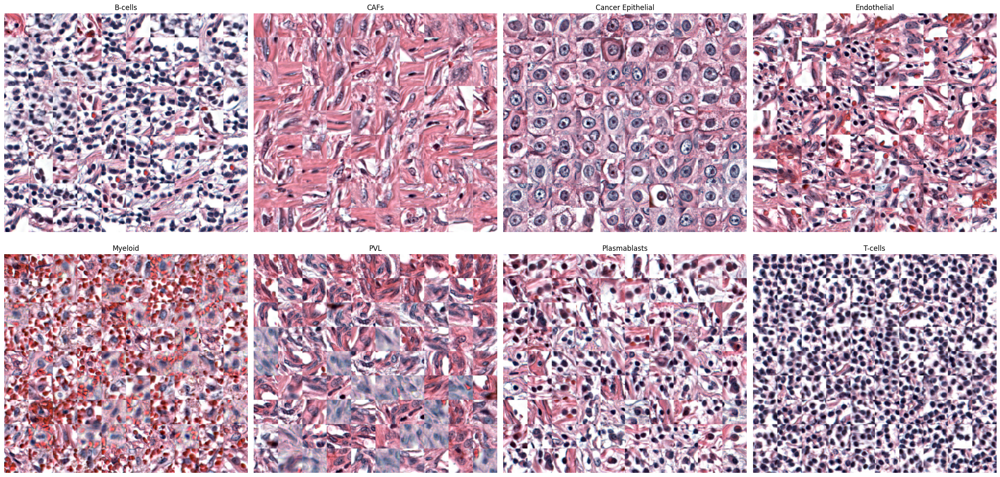

In [250]:
analyzer.plot_grid_celltype(n=90, selection="max", show_probs = False, display=True, nrows=2, ncols=4)

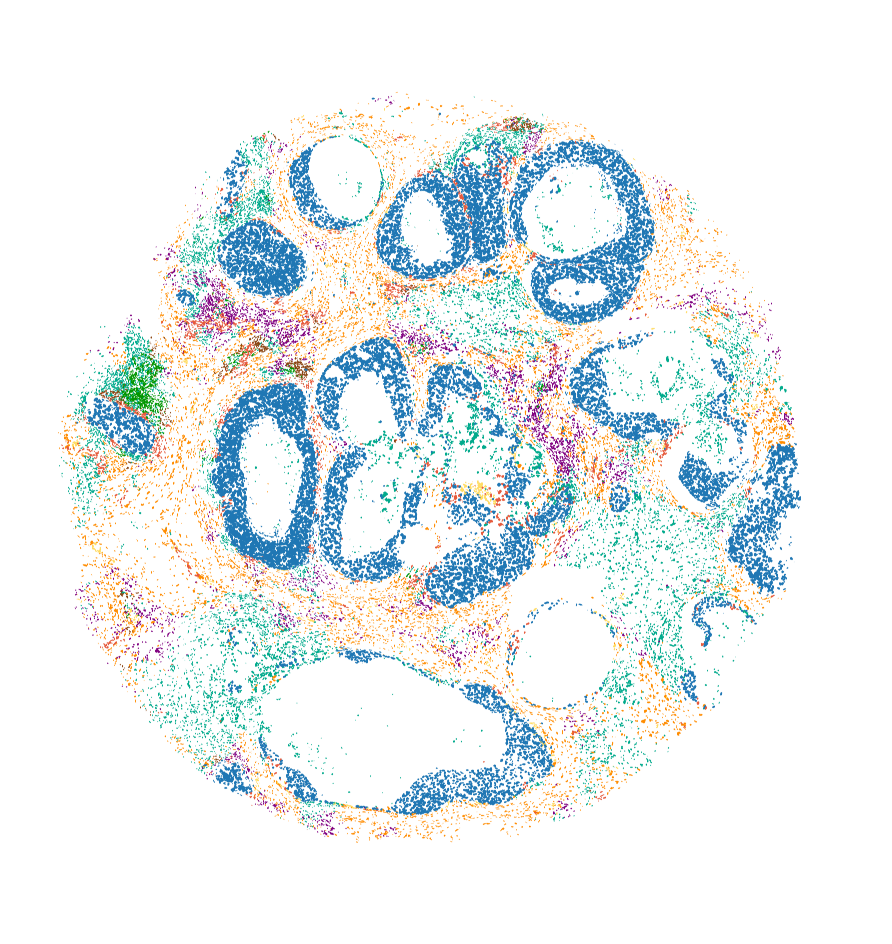

In [255]:
window = ((4900, 3400), (18800, 19900))
plotter.plot_seg_overlays(window, separated=False, scale_cells=2, display = True)

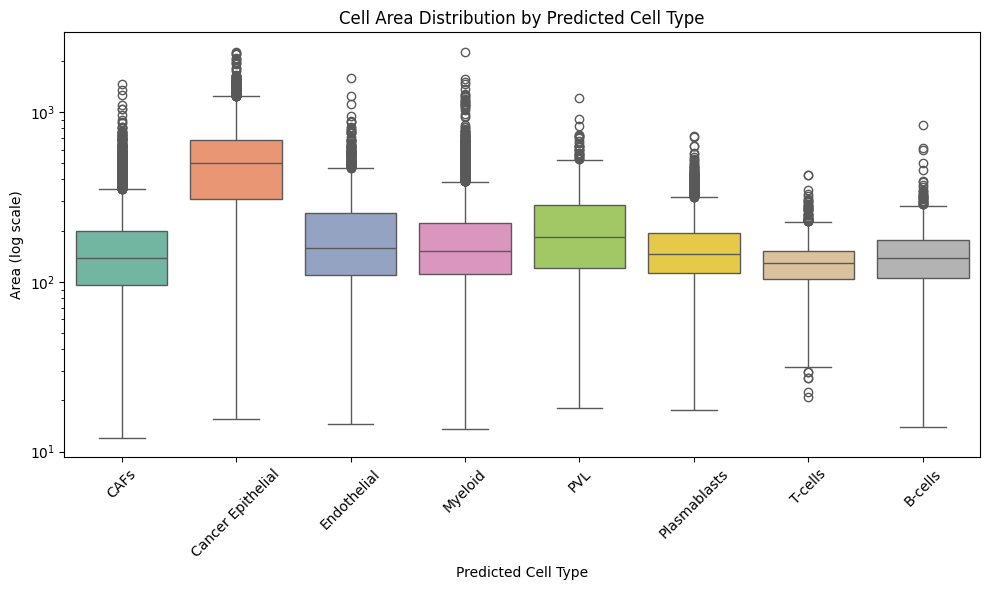

In [196]:
analyzer.compare_area(cell_types=ct_list[1:]+ ['B-cells'])

In [197]:
from scipy.stats import mannwhitneyu
from hedest.analysis.plots import polygon_area
import numpy as np

cell_type_a = "B-cells"
cell_type_b = "T-cells"

def p_to_star(p):
    if p <= 0.001:
        return '***'
    elif p <= 0.01:
        return '**'
    elif p <= 0.05:
        return '*'
    else:
        return 'ns'

areas_a = []
areas_b = []

for cell_id, info in analyzer.seg_dict_w_class["nuc"].items():
    cell_label = analyzer.predicted_labels.get(cell_id, {}).get("cell_type", None)
    contour = info.get("contour")
    if contour and len(contour) >= 3:
        area = polygon_area(contour)
        if cell_label == cell_type_a:
            areas_a.append(area)
        elif cell_label == cell_type_b:
            areas_b.append(area)

areas_a = np.array(areas_a)
areas_b = np.array(areas_b)

statistic, p_value = mannwhitneyu(areas_a, areas_b, alternative="greater")

print(f"U statistic: {statistic:.3f}")
print(f"One-sided p-value ({cell_type_a} > {cell_type_b}): {p_value:.4e} ({p_to_star(p_value)})")

U statistic: 586764.000
One-sided p-value (B-cells > T-cells): 9.6206e-09 (***)


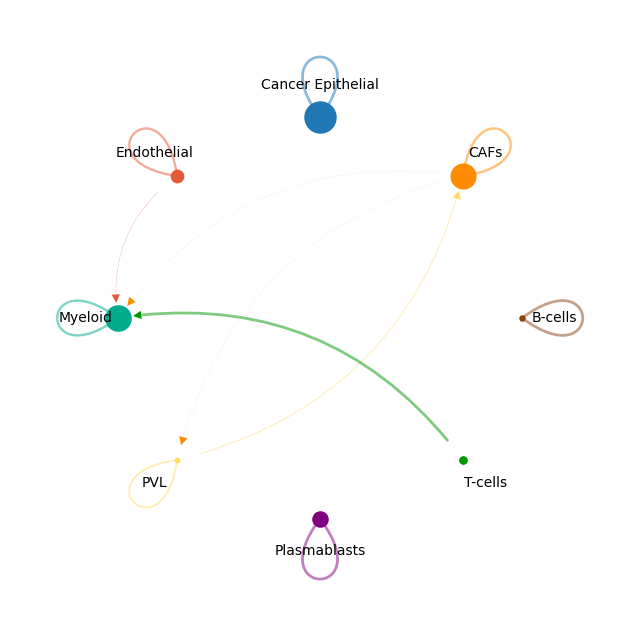

In [282]:
analyzer.compute_neighborhood_composition(compute_dist="centroid", max_distance=10)
analyzer.plot_colocalization_graph()

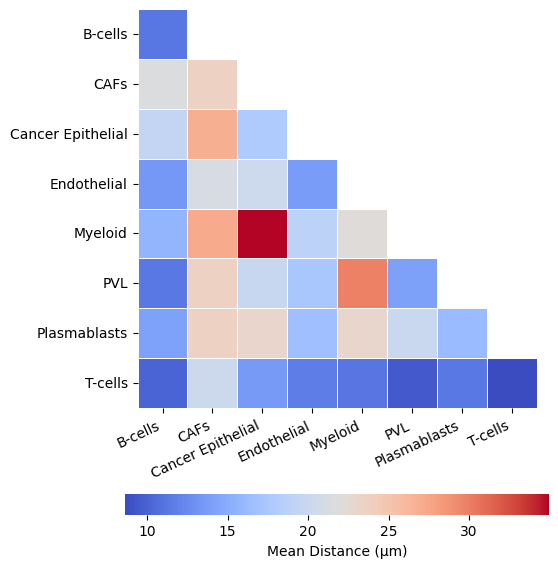

In [288]:
mean_distance = analyzer.plot_mean_neighbor_distances()